In [1]:
from azureml.core import Experiment, Run, Workspace
import azureml.core

# Check core SDK version number
print("SDK version:", azureml.core.VERSION)

SDK version: 1.18.0


In [2]:
ws = Workspace.from_config()

ws.name

'MLServiceWrokspace'

In [3]:
experiment_name = 'EmployeeTurnover'

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
#from sklearn.externals import joblib
import joblib
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix


/anaconda/envs/azureml_py36/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [5]:
empt = pd.read_csv("Challenge C Insider_Microsoft_issueDataset.csv")
empt['Email Domain'] = pd.factorize(empt['Email Domain'])[0]
empt.EmployeeLeft = empt.EmployeeLeft.astype(int)

In [6]:
empt.head()

,Current LinkedIn Activity,Email Domain,EmployeeLeft,LinkedIn Skill Code,Mentor Program Involvement (Scaled),Negative Review in Past 5 Years,Race (code),Recruiting Location Code,Recruiting Method Code,"Survey, Relative, Attitude toward Manager",...,"Survey, Relative, Attitude toward Work/Life Balance","Survey, Relative, Attitude toward Workload","Survey, Relative, Peer's Average Attitude toward Environment","Survey, Relative, Peer's Average Attitude toward Manager","Survey, Relative, Peer's Average Attitude toward Peers","Survey, Relative, Peer's Average Attitude toward Resources","Survey, Relative, Peer's Average Attitude toward Workload","Survey, Relative, Peer's Average Review of Employee",Weekly Hours Worked,Years of Service
0,2,0,1,43747,2,1,0,43747,43747,2,...,1,6,1,6,8,3,5,1,42,2
1,6,1,1,21249,4,0,3,10000,43747,2,...,2,2,3,4,4,1,3,4,42,6
2,3,2,1,10000,3,1,1,54996,43747,1,...,1,2,3,6,2,5,2,1,42,3
3,1,2,1,10000,3,1,2,43747,54996,2,...,1,3,3,3,7,7,2,1,46,5
4,2,3,0,32498,3,1,0,88743,77494,1,...,2,7,4,5,8,2,6,1,46,2


In [7]:
empt.dtypes

Current LinkedIn Activity                                       int64
Email Domain                                                    int64
EmployeeLeft                                                    int64
LinkedIn Skill Code                                             int64
Mentor Program Involvement (Scaled)                             int64
Negative Review in Past 5 Years                                 int64
Race (code)                                                     int64
Recruiting Location Code                                        int64
Recruiting Method Code                                          int64
Survey, Relative, Attitude toward Manager                       int64
Survey, Relative, Attitude toward Peers                         int64
Survey, Relative, Attitude toward Resources                     int64
Survey, Relative, Attitude toward Work/Life Balance             int64
Survey, Relative, Attitude toward Workload                      int64
Survey, Relative, Pe

In [8]:
#Split the data int a label and the features
y = empt.EmployeeLeft #Label
X = empt.drop('EmployeeLeft',axis=1) #Features
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, #Split 70-30
                                                    random_state=100, 
                                                    stratify=y) #Stratify by the species to make sure we have a fair sampling

print("Training = ", y_train.count(), "Testing = ", y_test.count())

Training =  11200 Testing =  2800


[[ 429  350]
 [ 398 1623]]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


Accuracy Score
73.28571428571429
CPU times: user 5.61 s, sys: 324 ms, total: 5.94 s
Wall time: 26.9 s


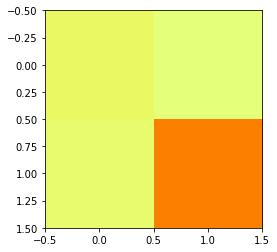

In [9]:
%%time

from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier

from azureml.contrib.interpret.explanation.explanation_client import ExplanationClient
from interpret.ext.blackbox import TabularExplainer

#Train a tree
classifier = DecisionTreeClassifier()
classifier.fit(X_train, y_train)

#Run the predictions
y_pred = classifier.predict(X_test)

#See the accuracy
accuracy_score(y_test, y_pred)

experiment = Experiment(workspace=ws, name=experiment_name)
run = experiment.start_logging()

##Tag in Azure
run.tag("Description","DecisionTree")
run.log('DecisionTree', 'DecisionTreeClassifier')

#Run the training
clf = DecisionTreeClassifier()
clf.fit(X_train,y_train)

#PRedict with test data
y_pred = (clf.predict(X_test))

#Record Accuracy etc
run.log('Accuracy', (accuracy_score(y_test, y_pred)* 100))

#Upload model
joblib.dump(value=clf, filename='MLPClassifier.pkl')
run.upload_file(name='outputs/MLPClassifier.pkl', path_or_stream='./MLPClassifier.pkl')

cm = confusion_matrix(y_test, y_pred)
print(cm)

#Save the confusion Matrix
plt.clf()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
run.log_image("ConfusionMatrix", path=None, plot=plt)

#Save the model explainability
client = ExplanationClient.from_run(run)

explainer = TabularExplainer(clf, 
                             X_train)
#,                             classes=classes)
global_explanation = explainer.explain_global(X_test)
client.upload_model_explanation(global_explanation, comment='global explanation: all features')

run.complete()

print ('Accuracy Score');
print (accuracy_score(y_test, y_pred)* 100);

In [10]:
%%time
global_explanation = explainer.explain_global(X_train)

CPU times: user 14.7 s, sys: 7.81 ms, total: 14.7 s
Wall time: 29.8 s


In [11]:
import pandas as pd
pd.DataFrame(global_explanation.get_ranked_global_values(), global_explanation.get_ranked_global_names())

,0
Current LinkedIn Activity,0.166670
Race (code),0.093369
"Survey, Relative, Peer's Average Attitude toward Peers",0.066311
"Survey, Relative, Attitude toward Resources",0.035154
"Survey, Relative, Peer's Average Attitude toward Resources",0.034857
"Survey, Relative, Peer's Average Attitude toward Manager",0.027399
"Survey, Relative, Peer's Average Review of Employee",0.024760
Mentor Program Involvement (Scaled),0.018549
Email Domain,0.018083
"Survey, Relative, Peer's Average Attitude toward Workload",0.017547


In [12]:
##Warning - Additional setup needed to run in Jupyter labs
from interpret_community.widget import ExplanationDashboard

ExplanationDashboard(global_explanation, classifier, datasetX=X_train)

In [13]:
y_pred

array([1, 1, 1, ..., 0, 1, 1])

In [14]:
#! pip install fairlearn

In [15]:
from fairlearn.widget import FairlearnDashboard

FairlearnDashboard(sensitive_features=X_test['Race (code)'],
                       sensitive_feature_names=['Race (code)'],
                       y_true=y_test,
                       y_pred={"initial model": y_pred})

The FairlearnDashboard will move from Fairlearn to the raiwidgets package after the v0.5.0 release. Instead, Fairlearn will provide some of the existing functionality through matplotlib-based visualizations.


FairlearnWidget(value={'true_y': [1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1…

In [29]:
%%time
from fairlearn.reductions import ExponentiatedGradient, DemographicParity, GridSearch
constraint = DemographicParity()
classifier = DecisionTreeClassifier()
mitigator = ExponentiatedGradient(classifier, constraint)
mitigator.fit(X_test, y_test, sensitive_features=X_test['Race (code)'])
y_pred_mitigated = mitigator.predict(X_test)


CPU times: user 59.3 s, sys: 11.9 ms, total: 59.4 s
Wall time: 1min


In [31]:
%%time
from fairlearn.reductions import ExponentiatedGradient, DemographicParity, GridSearch
constraint = DemographicParity()
classifier = DecisionTreeClassifier()
mitigator = ExponentiatedGradient(classifier, constraint)
mitigator.fit(X_train, y_train, sensitive_features=X_train['Race (code)'])
y_pred_mitigated = mitigator.predict(X_test)


CPU times: user 4min 1s, sys: 260 ms, total: 4min 1s
Wall time: 4min 10s


In [33]:
#View the results
FairlearnDashboard(sensitive_features=X_test['Race (code)'],
                       sensitive_feature_names=['Race (code)'],
                       y_true=y_test,
                       y_pred={"initial model": y_pred, "mitigated model": y_pred_mitigated})

FairlearnWidget(value={'true_y': [1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1…